In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
from collections import Counter
from datetime import datetime
import pickle
import copy
import datetime
import sys

import geopandas as gpd
import shapely.geometry
import rasterio
import json
import geopandas as gpd
import geopandas_osm.osm
from descartes import PolygonPatch
import h5py 
from scipy.misc import imresize
import shapely.geometry
import cv2

In [2]:
#!sudo pip install xgboost
#!sudo pip install --upgrade xgboost

#import xgboost

#%matplotlib inline
#%config InlineBackend.figure_format = 'retina'

In [218]:
output_dir = "/home/ubuntu/data/TX_paired/"

geo_df = pickle.load( open( output_dir+"GeoDataFrame_fine_turked.pickled", "rb" ))
geo_df.rename(columns = {'post-storm_full':'post_resized','pre-storm_full':'pre_resized','post-storm_resized':'post_full','pre-storm_resized':'pre_full'}, inplace=True)
geo_df.set_index("tile_no")
geo_df.head(2)

,tile_no,flooded,post_resized,pre_resized,post_full,pre_full,course_mask_full,course_mask_resized,fine_mask_filename,footprint,dry_or_wet,mask_poly,tile_transform,geometry,DBScan,DBScan_gauss,bad_image,problem,verified
0,0,0.80323,0_post_resize_img,0_pre_resize_img,0_post_full_img,0_pre_full_img,0_mask,0_resize_mask,0_256_fine_mask,3002220.tif,wet,(POLYGON ((-95.57181511210993 29.4410615808823...,"[222822.4, 0.0, 0.0, -222822.4, 21295616.0, 65...",POLYGON ((-95.56985294117646 29.44106158088235...,0_256_DBSCAN,0_256_fine_mask_blur,None,None,False
1,1,0.8787,1_post_resize_img,1_pre_resize_img,1_post_full_img,1_pre_full_img,1_mask,1_resize_mask,1_256_fine_mask,3002220.tif,wet,POLYGON ((-95.56764981800494 29.44136752727207...,"[222822.4, 0.0, 0.0, -222822.4, 21295104.0, 65...",POLYGON ((-95.56755514705883 29.44106158088235...,1_256_DBSCAN,1_256_fine_mask_blur,None,None,True


In [219]:
INPUT_SIZE = 256

In [220]:
#identify a training/testing set

## make test/train split
#### assumes image and mask files are of identical number and none are missing

In [221]:
geo_df.head(1)

,tile_no,flooded,post_resized,pre_resized,post_full,pre_full,course_mask_full,course_mask_resized,fine_mask_filename,footprint,dry_or_wet,mask_poly,tile_transform,geometry,DBScan,DBScan_gauss,bad_image,problem,verified
0,0,0.80323,0_post_resize_img,0_pre_resize_img,0_post_full_img,0_pre_full_img,0_mask,0_resize_mask,0_256_fine_mask,3002220.tif,wet,(POLYGON ((-95.57181511210993 29.4410615808823...,"[222822.4, 0.0, 0.0, -222822.4, 21295616.0, 65...",POLYGON ((-95.56985294117646 29.44106158088235...,0_256_DBSCAN,0_256_fine_mask_blur,None,None,False


In [225]:
#only use 'good' and verified files
good_geo_df = geo_df[geo_df.bad_image != True]
good_geo_df = good_geo_df[good_geo_df.verified == True]
good_geo_df = good_geo_df[good_geo_df.tile_no <1000]  #take a smaller subset of data for faster testing
len(good_geo_df)

525

In [226]:
#note, these are the 256 resized images
image_files = sorted([output_dir+file+'.npy' for file in good_geo_df["post_resized"].values])  
before_image_files = sorted([output_dir+file+'.npy' for file in good_geo_df["pre_resized"].values])  
mask_files = sorted([output_dir+file+'.npy' for file in good_geo_df["DBScan_gauss"].values])

In [227]:

len(image_files),len(mask_files)
#min([len(image_files),len(mask_files)])


(525, 525)

In [228]:
def TT_tile_no_split(good_geo_df,split=0.8):
    test_no = np.random.choice(good_geo_df.tile_no.values,int((1-split)*len(good_geo_df)))
    train_no = [num for num in good_geo_df.tile_no.values if num not in test_no]
    return train_no, test_no

In [229]:
train_no, test_no = TT_tile_no_split(good_geo_df,split=0.8)

In [230]:
len(train_no),len(test_no)

(435, 104)

In [231]:
#write test and train tile_no lists to disk
f = open('/home/ubuntu/Notebooks/test_train_filelists/xgb_train_tile_no_'+str(datetime.datetime.now())+'.txt', 'w')
for item in train_no:f.write("%s\n" % item)
f.close()

f = open('/home/ubuntu/Notebooks/test_train_filelists/xgb_test_tile_no_'+str(datetime.datetime.now())+'.txt', 'w')
for item in test_no:f.write("%s\n" % item)
f.close()

In [232]:
test_no

array([118, 34, 269, 670, 515, 885, 386, 385, 946, 827, 9, 435, 725, 95,
       494, 702, 736, 177, 148, 195, 774, 404, 926, 972, 505, 887, 806,
       187, 628, 9, 782, 385, 714, 599, 249, 83, 928, 974, 892, 778, 818,
       557, 54, 893, 89, 190, 926, 692, 55, 772, 183, 782, 89, 278, 257,
       460, 584, 972, 556, 448, 965, 237, 54, 34, 267, 772, 609, 143, 281,
       420, 930, 362, 415, 394, 815, 441, 991, 654, 594, 994, 551, 809,
       114, 545, 528, 520, 448, 83, 945, 15, 167, 706, 582, 34, 77, 237,
       260, 31, 667, 148, 87, 576, 149, 896], dtype=object)

### make memory-friendly generators instead of a large X,Y to hold in memory

In [233]:
output_dir+good_geo_df.post_resized[2]+'.npy'

'/home/ubuntu/data/TX_paired/2_post_resize_img.npy'

In [234]:
def gen_train(good_geo_df,train_no):
    indexes = copy.deepcopy(train_no)
    while True:
        np.random.shuffle(indexes)

        for index in indexes:
            Xpost = np.load(output_dir+good_geo_df.post_resized[index]+'.npy')
            Xpre = np.load(output_dir+good_geo_df.pre_resized[index]+'.npy')
            Xpre = Xpre.astype('float32')
            Xpost = Xpost.astype('float32')
            pre_mean = 92.36813   #taken from a central common image
            post_mean = 92.21524   #much closer than expected... are these representative?
            
            Xdiff = Xpost/post_mean - Xpre/pre_mean
            
            Xpost = (Xpost-post_mean)/post_mean  #divide by their respective means (per footprint would be even better)
            Xpre =  (Xpre-pre_mean)/pre_mean
            
            R,G,B = Xpost[:,:,0],Xpost[:,:,1],Xpost[:,:,2]
            Xratios_post = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)
            
            R,G,B = Xpre[:,:,0],Xpre[:,:,1],Xpre[:,:,2]
            Xratios_pre  = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)
            
            X = np.concatenate([Xpost,Xdiff,Xpre,Xratios_post,Xratios_pre],axis=2)
             
            Y = np.load(output_dir+good_geo_df.DBScan_gauss[index]+'.npy')
            Y = Y.astype('float32') #/ 255.
            #add extra first dimension for tensorflow compatability
            X = np.expand_dims(X,axis=0)
            Y = np.expand_dims(Y,axis=0)
            Y = np.expand_dims(Y,axis=3)
            yield (X,Y)

In [235]:
def gen_test(good_geo_df,test_no):
    indexes = copy.deepcopy(test_no)
    while True:
        np.random.shuffle(indexes)

        for index in indexes:
            Xpost = np.load(output_dir+good_geo_df.post_resized[index]+'.npy')
            Xpre = np.load(output_dir+good_geo_df.pre_resized[index]+'.npy')
            Xpre = Xpre.astype('float32')
            Xpost = Xpost.astype('float32')
            pre_mean = 92.36813   #taken from a central common image
            post_mean = 92.21524   #much closer than expected... are these representative?
            
            Xdiff = Xpost/post_mean - Xpre/pre_mean
            
            Xpost = (Xpost-post_mean)/post_mean  #divide by their respective means (per footprint would be even better)
            Xpre =  (Xpre-pre_mean)/pre_mean
            
            R,G,B = Xpost[:,:,0],Xpost[:,:,1],Xpost[:,:,2]
            Xratios_post = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)
            
            R,G,B = Xpre[:,:,0],Xpre[:,:,1],Xpre[:,:,2]
            Xratios_pre  = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)
            
            X = np.concatenate([Xpost,Xdiff,Xpre,Xratios_post,Xratios_pre],axis=2)
             
            Y = np.load(output_dir+good_geo_df.DBScan_gauss[index]+'.npy')
            Y = Y.astype('float32') #/ 255.
            #add extra first dimension for tensorflow compatability
            X = np.expand_dims(X,axis=0)
            Y = np.expand_dims(Y,axis=0)
            Y = np.expand_dims(Y,axis=3)
            yield (X,Y)

# Load test/train set

In [236]:
def get_train(good_geo_df,train_no):
    indexes = copy.deepcopy(train_no)
    
    np.random.shuffle(indexes)
    X_train = []
    Y_train = []
    
    for index in indexes:
        Xpost = np.load(output_dir+good_geo_df.post_resized[index]+'.npy')
        Xpre = np.load(output_dir+good_geo_df.pre_resized[index]+'.npy')
        Xpre = Xpre.astype('float32')
        Xpost = Xpost.astype('float32')
        pre_mean = 92.36813   #taken from a central common image
        post_mean = 92.21524   #much closer than expected... are these representative?

        Xdiff = Xpost/post_mean - Xpre/pre_mean

        Xpost = (Xpost-post_mean)/post_mean  #divide by their respective means (per footprint would be even better)
        Xpre =  (Xpre-pre_mean)/pre_mean

        R,G,B = Xpost[:,:,0],Xpost[:,:,1],Xpost[:,:,2]
        Xratios_post = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)

        R,G,B = Xpre[:,:,0],Xpre[:,:,1],Xpre[:,:,2]
        Xratios_pre  = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)

        X = np.concatenate([Xpost,Xdiff,Xpre,Xratios_post,Xratios_pre],axis=2)

        Y = np.load(output_dir+good_geo_df.DBScan_gauss[index]+'.npy')
        Y = Y.astype('float32') #/ 255.
        
        X = np.reshape(X,(X.shape[0]**2,X.shape[2]))
        Y = np.reshape(Y,(Y.shape[0]**2))
        
        X_train.append(X)
        Y_train.append(Y)
        
    X_train = np.asarray(X_train)
    Y_train = np.asarray(Y_train)

    X_train = np.reshape(X_train,(X_train.shape[0]*X_train.shape[1],X_train.shape[2]))
    Y_train = np.reshape(Y_train,(Y_train.shape[0]*Y_train.shape[1]))
                         
    return X_train, Y_train


In [237]:
def get_test(good_geo_df,test_no):
    indexes = copy.deepcopy(test_no)
    
    np.random.shuffle(indexes)
    X_test = []
    Y_test = []
    
    for index in indexes:
        Xpost = np.load(output_dir+good_geo_df.post_resized[index]+'.npy')
        Xpre = np.load(output_dir+good_geo_df.pre_resized[index]+'.npy')
        Xpre = Xpre.astype('float32')
        Xpost = Xpost.astype('float32')
        pre_mean = 92.36813   #taken from a central common image
        post_mean = 92.21524   #much closer than expected... are these representative?

        Xdiff = Xpost/post_mean - Xpre/pre_mean

        Xpost = (Xpost-post_mean)/post_mean  #divide by their respective means (per footprint would be even better)
        Xpre =  (Xpre-pre_mean)/pre_mean

        R,G,B = Xpost[:,:,0],Xpost[:,:,1],Xpost[:,:,2]
        Xratios_post = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)

        R,G,B = Xpre[:,:,0],Xpre[:,:,1],Xpre[:,:,2]
        Xratios_pre  = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)

        X = np.concatenate([Xpost,Xdiff,Xpre,Xratios_post,Xratios_pre],axis=2)

        Y = np.load(output_dir+good_geo_df.DBScan_gauss[index]+'.npy')
        Y = Y.astype('float32') #/ 255.
        
        X = np.reshape(X,(X.shape[0]**2,X.shape[2]))
        Y = np.reshape(Y,(Y.shape[0]**2))
        
        X_test.append(X)
        Y_test.append(Y)
        
    X_test = np.asarray(X_test)
    Y_test = np.asarray(Y_test)

    X_test = np.reshape(X_test,(X_test.shape[0]*X_test.shape[1],X_test.shape[2]))
    Y_test = np.reshape(Y_test,(Y_test.shape[0]*Y_test.shape[1]))
                         
    return X_test, Y_test

In [238]:
X_train,Y_train = get_train(good_geo_df,train_no)

In [239]:
X_test, Y_test  = get_test(good_geo_df,test_no)

In [240]:
X_train.shape, Y_train.shape

((28508160, 21), (28508160,))

In [241]:
len(X_train),X_train[0].shape,Y_train[0].shape

(28508160, (21,), ())

In [242]:
len(X_test),X_test[0].shape,Y_test[0].shape

(6815744, (21,), ())

In [243]:
len(train_no),len(test_no)

(435, 104)

## MAKE and train an XGboost model

In [244]:
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score

In [245]:
X_train.shape

(28508160, 21)

In [246]:
X_train.nbytes/1e9,X_test.nbytes/1e9,"in Gigabytes"

(2.39468544, 0.572522496, 'in Gigabytes')

In [247]:
model = XGBClassifier(max_depth=9, learning_rate=0.1, n_estimators=10)
#model.fit(X_train, Y_train)
model.fit(X_train, Y_train)

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=9,
       min_child_weight=1, missing=None, n_estimators=10, nthread=-1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)

In [248]:
# see how it did

In [249]:
y_pred = model.predict(X_test)

In [250]:
accuracy = (y_pred==Y_test).sum()*1.0/len(y_pred)
accuracy
#default yielded accuracy = 0.747

0.8767004746657151

###  gridsearch

In [251]:
"""md=9
lr=0.1
n_est=10
print(n_est)
for x in n_est:
    model = XGBClassifier(max_depth=md, learning_rate=lr, n_estimators=x, silent=False,)
    model.fit(X_train, Y_train)
    y_pred = model.predict(X_test)
    accuracy = (y_pred==Y_test).sum()*1.0/len(y_pred)
    print("x = ",x,"accuracy =",accuracy)"""

'md=9\nlr=0.1\nn_est=10\nprint(n_est)\nfor x in n_est:\n    model = XGBClassifier(max_depth=md, learning_rate=lr, n_estimators=x, silent=False,)\n    model.fit(X_train, Y_train)\n    y_pred = model.predict(X_test)\n    accuracy = (y_pred==Y_test).sum()*1.0/len(y_pred)\n    print("x = ",x,"accuracy =",accuracy)'

## predict on a random test image

782


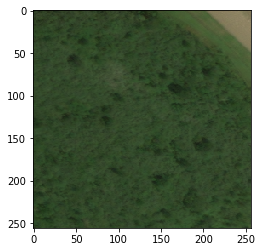

In [252]:
index = np.random.choice(test_no,1)[0]
print(index)
#process the image as the training set was
Xview = np.load(output_dir+good_geo_df.post_resized[index]+'.npy')
Xpost = np.load(output_dir+good_geo_df.post_resized[index]+'.npy')
Xpre  = np.load(output_dir+good_geo_df.pre_resized[index]+'.npy')
Xpre  = Xpre.astype('float32')
Xpost = Xpost.astype('float32')
pre_mean = 92.36813   #taken from a central common image
post_mean = 92.21524   #much closer than expected... are these representative?

Xdiff = Xpost/post_mean - Xpre/pre_mean

Xpost = (Xpost-post_mean)/post_mean  #divide by their respective means (per footprint would be even better)
Xpre =  (Xpre-pre_mean)/pre_mean

R,G,B = Xpost[:,:,0],Xpost[:,:,1],Xpost[:,:,2]
Xratios_post = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)

R,G,B = Xpre[:,:,0],Xpre[:,:,1],Xpre[:,:,2]
Xratios_pre  = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)

X = np.concatenate([Xpost,Xdiff,Xpre,Xratios_post,Xratios_pre],axis=2)
Y = np.load(output_dir+good_geo_df.DBScan_gauss[index]+'.npy')
Y = Y.astype('float32') #/ 255.

X = np.reshape(X,(X.shape[0]**2,X.shape[2]))
Y = np.reshape(Y,(Y.shape[0]**2))

plt.imshow(Xview)
plt.show();

#predict on that picture

In [253]:
prediction = model.predict(X)

In [254]:
predicted_image = np.reshape(prediction,(256,256))

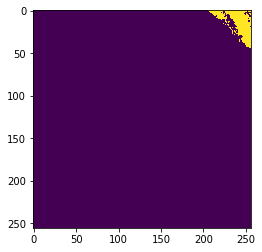

In [255]:
plt.imshow(predicted_image)
plt.show()

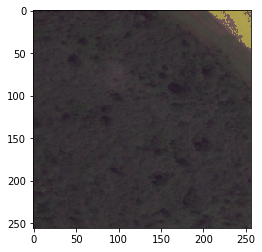

In [256]:
plt.imshow(Xview)
plt.imshow(255*predicted_image,alpha=0.3)
plt.show()

In [257]:
prob = model.predict_proba(X)
prob_image = np.reshape(prob[:,1],(256,256))

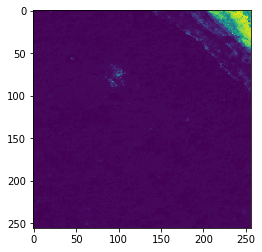

In [258]:
plt.imshow(prob_image)
plt.show()

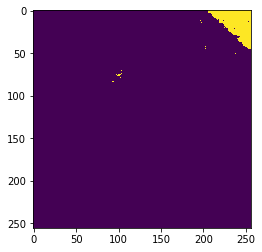

In [259]:
plt.imshow(prob_image>0.35)
plt.show()

# What is baseline for this dataset?

In [260]:
per_flooded = Y_train.sum()/len(Y_train)
per_flooded

0.29913803626751079

# look at ROC and AUC

In [170]:
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

In [171]:
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:,1]

In [172]:
Y_test.shape,y_pred.shape

((3801088,), (3801088,))

In [261]:
print(classification_report(Y_test, y_pred))

             precision    recall  f1-score   support

        0.0       0.89      0.95      0.92   5148244
        1.0       0.80      0.66      0.72   1667500

avg / total       0.87      0.88      0.87   6815744



In [262]:
fpr, tpr, thresholds = roc_curve(Y_test, y_proba)
roc_auc = auc(fpr, tpr)

print('XGBoost model')
print('AUC: ' + str(roc_auc))
print("")

ValueError: Found input variables with inconsistent numbers of samples: [6815744, 3801088]

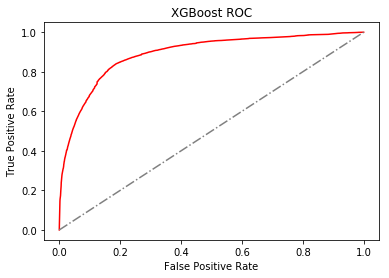

In [175]:
plt.plot(fpr, tpr, color = 'red')
plt.plot([0,1],[0,1], '-.', color = 'grey')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBoost ROC');
plt.show()

# Predict on an entire footprint?!
This would NOT be possible for the U-net, it would have to do it as a mosaic, which is a lot of extra work

In [176]:
#footprint = "HOLDOUT/2131133.tif"
footprint = "HOLDOUT/2131131.tif"

#load a hold-out footprint:
src_pre = rasterio.open('/home/ubuntu/data/TX_pre/'+footprint)
img_pre = src_pre.read([1, 2, 3]).transpose([1,2,0])
# Plot it
#fig, ax = plt.subplots(figsize=(10,10))
#plt.imshow(img);

In [177]:
src_post = rasterio.open('/home/ubuntu/data/TX_post/'+footprint)
img_post = src_post.read([1, 2, 3]).transpose([1,2,0])

In [178]:
img_post.shape

(19584, 19584, 3)

In [179]:
meta = src_post.meta

In [180]:
str(meta)

"{'count': 3, 'crs': CRS({'init': u'epsg:4326'}), 'dtype': 'uint8', 'affine': Affine(4.487879136029412e-06, 0.0, -95.712890625,\n       0.0, -4.487879136029412e-06, 29.794921875), 'driver': u'GTiff', 'transform': (-95.712890625, 4.487879136029412e-06, 0.0, 29.794921875, 0.0, -4.487879136029412e-06), 'height': 19584, 'width': 19584, 'nodata': 0.0}"

### Build input data from these 2 images

In [181]:
#resize them by factor of 2
resize_width = img_post.shape[0]/2
r = resize_width / (1.0*img_post.shape[1])
dim = (resize_width, int(img_post.shape[0] * r))
img_post_resized = cv2.resize(img_post, dim, interpolation = cv2.INTER_AREA)
img_pre_resized  = cv2.resize(img_pre, dim, interpolation = cv2.INTER_AREA)
img_post_resized.shape

(9792, 9792, 3)

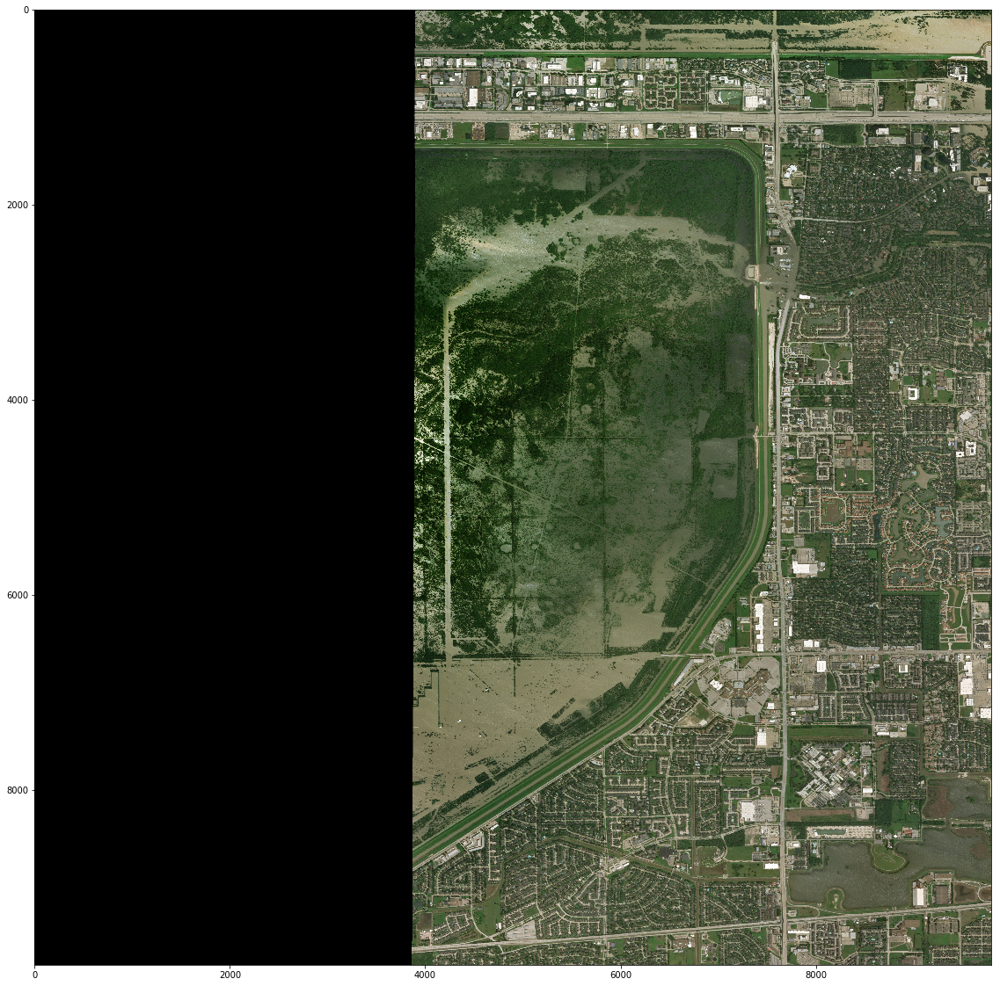

In [182]:
plt.figure(figsize=(20,20))
plt.imshow(img_post_resized)
plt.show()

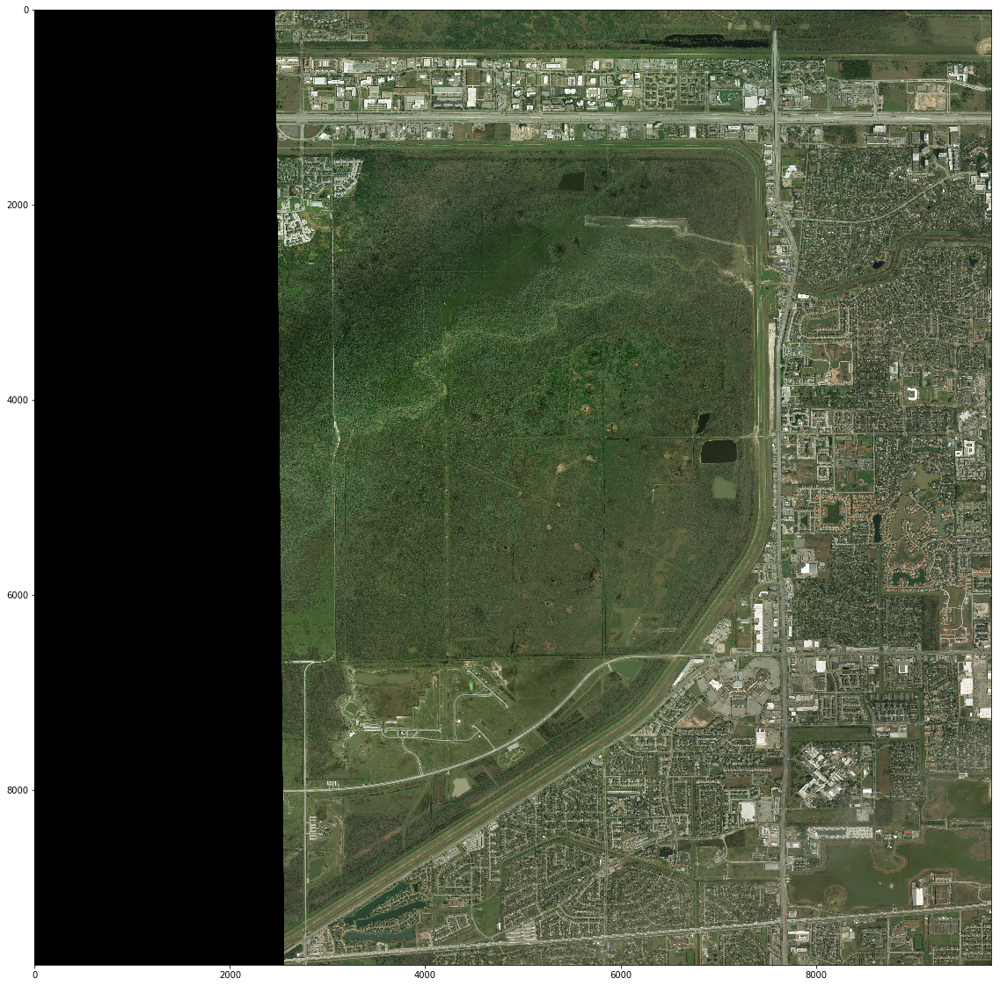

In [183]:
plt.figure(figsize=(20,20))
plt.imshow(img_pre_resized)
plt.show()

In [184]:
#rename image data, so I can use previously written code:
Xpost = img_post_resized
Xpre  = img_pre_resized

#same code as for 1 tile:

pre_mean = 92.36813   #taken from a central common image
post_mean = 92.21524   #much closer than expected... are these representative?

Xdiff = Xpost/post_mean - Xpre/pre_mean

Xpost = (Xpost-post_mean)/post_mean  #divide by their respective means (per footprint would be even better)
Xpre =  (Xpre-pre_mean)/pre_mean

R,G,B = Xpost[:,:,0],Xpost[:,:,1],Xpost[:,:,2]
Xratios_post = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)

R,G,B = Xpre[:,:,0],Xpre[:,:,1],Xpre[:,:,2]
Xratios_pre  = np.stack([R/G,R/B,G/B,R/(G+B),G/(R+B),B/(R+G)],axis=2)

X = np.concatenate([Xpost,Xdiff,Xpre,Xratios_post,Xratios_pre],axis=2)
Y = np.load(output_dir+good_geo_df.DBScan_gauss[index]+'.npy')
Y = Y.astype('float32') #/ 255.

X = np.reshape(X,(X.shape[0]**2,X.shape[2]))
Y = np.reshape(Y,(Y.shape[0]**2))

X.shape

(95883264, 21)

In [185]:
prediction = model.predict(X)

In [186]:
predicted_image = np.reshape(prediction,img_post_resized.shape[:2])

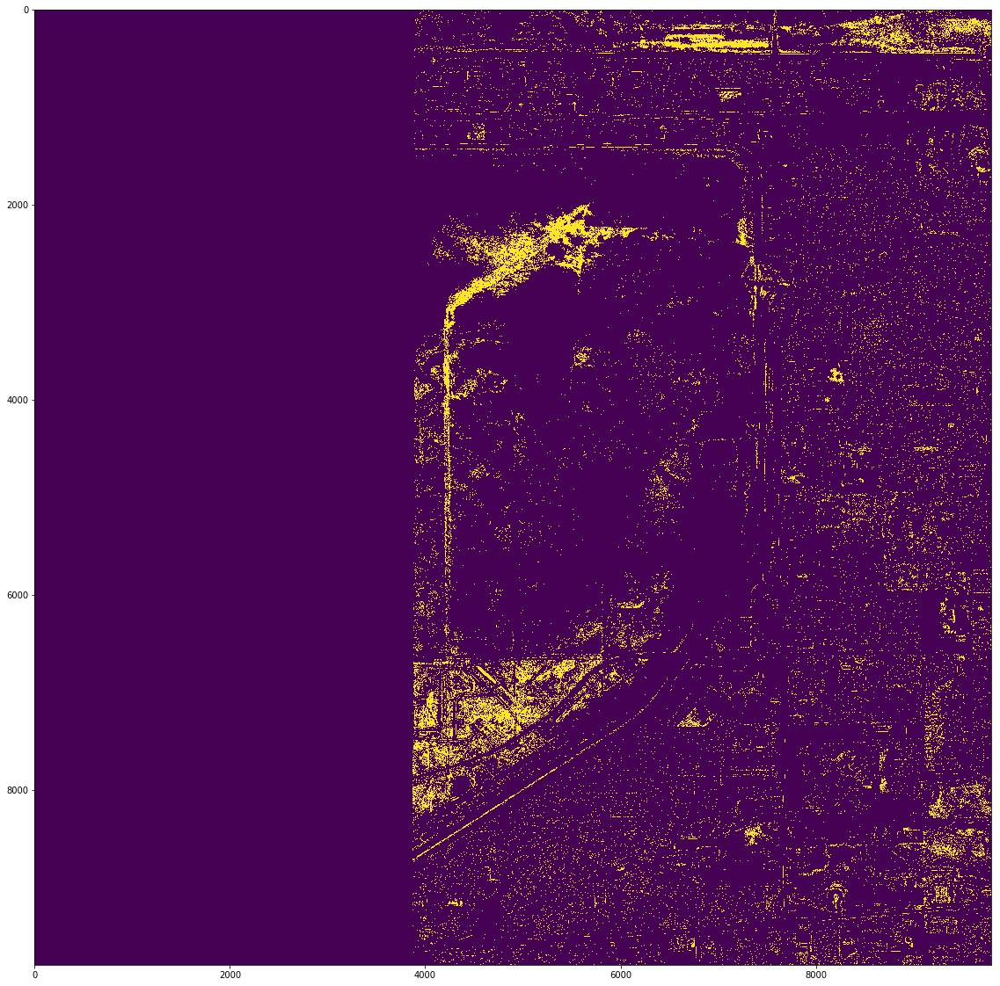

In [187]:
plt.figure(figsize=(20,20))
plt.imshow(predicted_image)
plt.show()

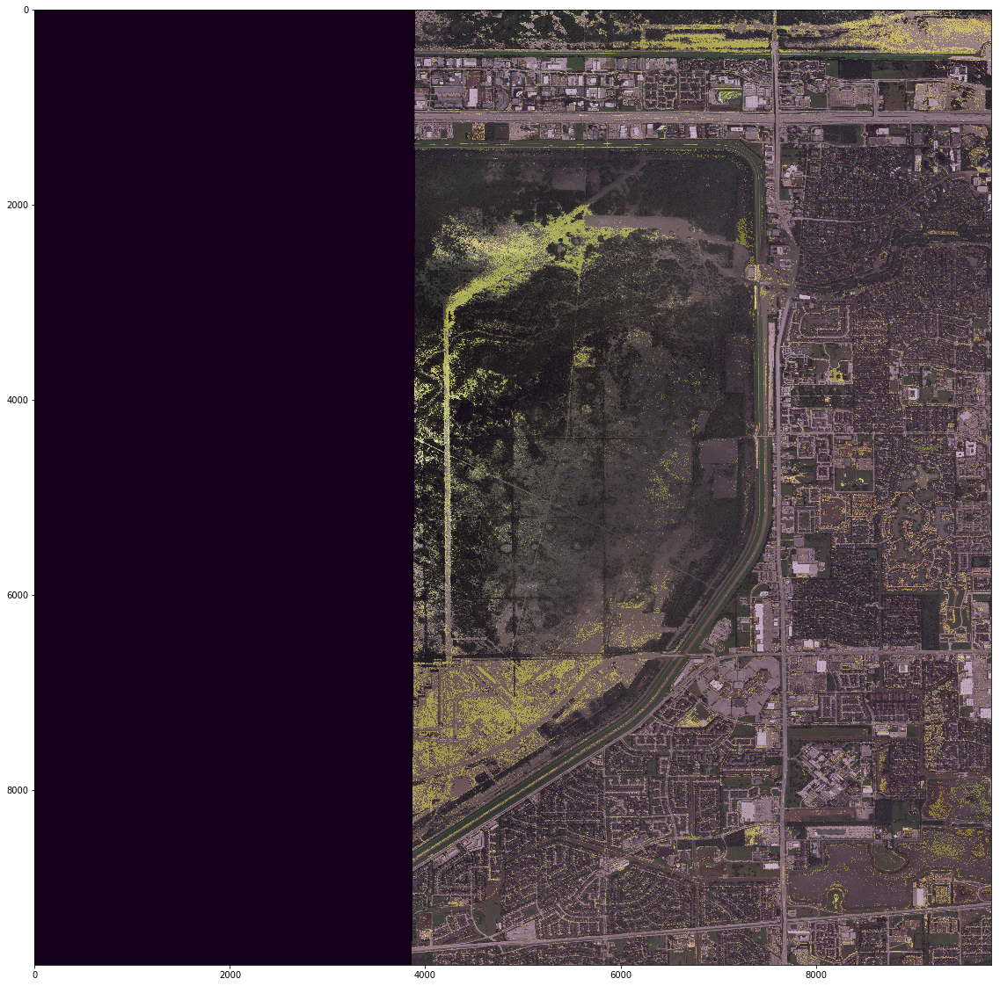

In [188]:
plt.figure(figsize=(20,20))
plt.imshow(img_post_resized)
plt.imshow(255*predicted_image,alpha=0.3)
plt.show()

In [189]:
prob = model.predict_proba(X)
prob_image = np.reshape(prob[:,1],img_post_resized.shape[:2])

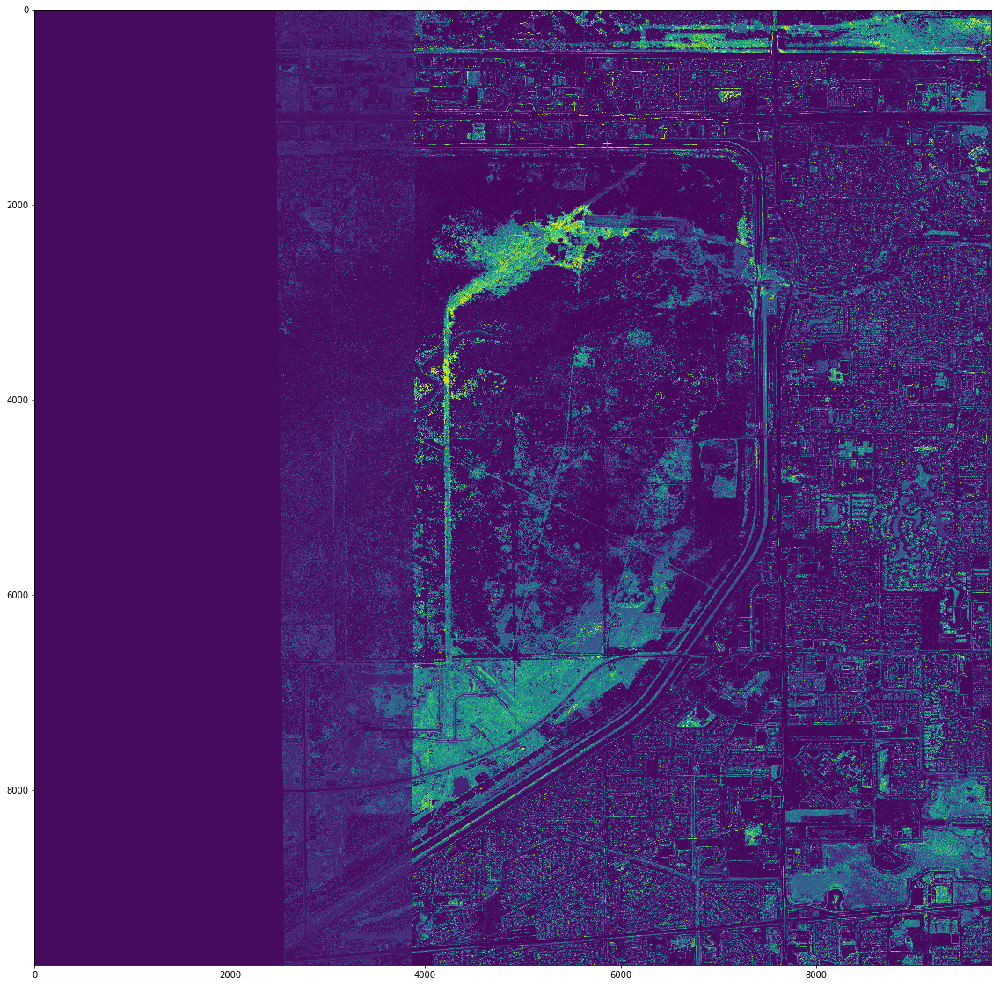

In [190]:
plt.figure(figsize=(20,20))
plt.imshow(prob_image)
plt.show()

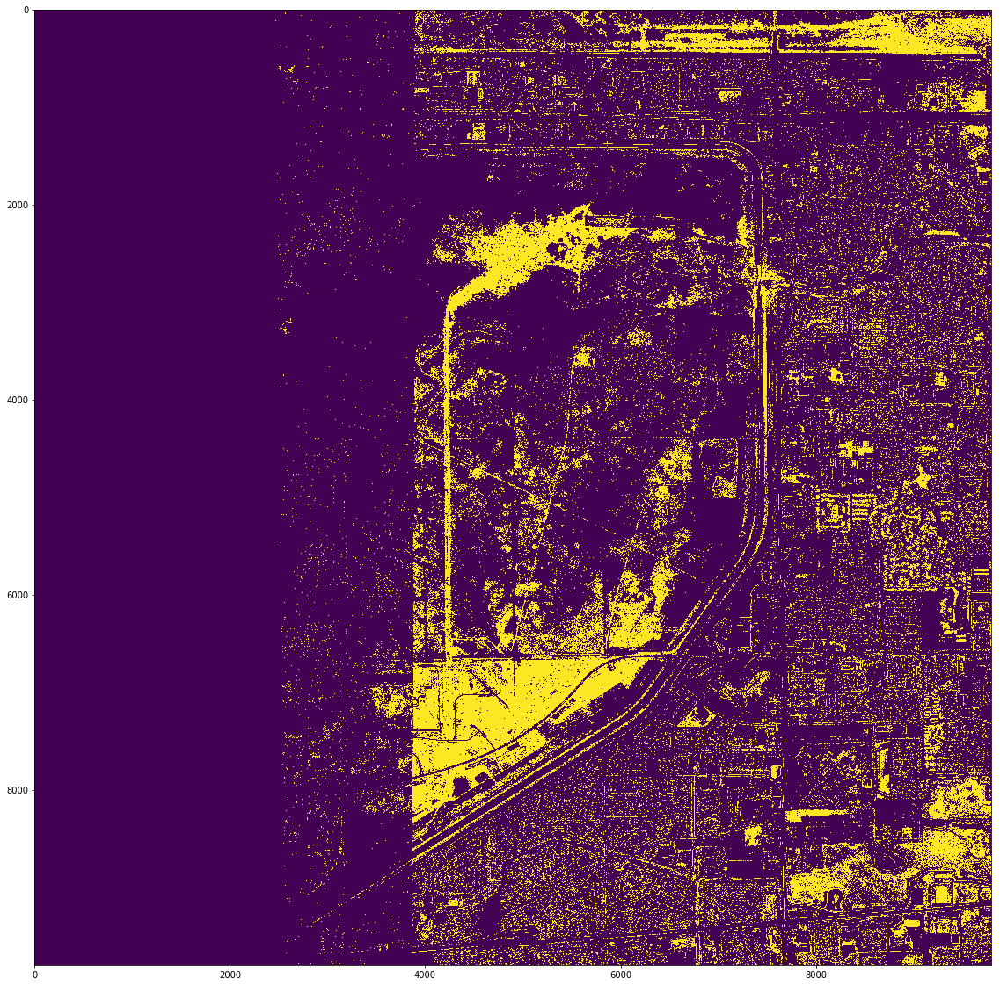

In [191]:
plt.figure(figsize=(20,20))
plt.imshow(prob_image>0.35)
plt.show()